In [1]:
import numpy as np
import astropy.units as u
from astropy.io import fits
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload
from scipy.optimize import minimize

import poppy
import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

from adefc_vortex.math_module import xp, xcipy, ensure_np_array
from adefc_vortex import utils
from adefc_vortex.imshows import imshow1, imshow2, imshow3, plot_data
from adefc_vortex import dm
from adefc_vortex import props
from adefc_vortex import aefc_2dm as aefc
import adefc_vortex.pwp as pwp
import adefc_vortex.fresnel_2dm_96 as fresnel
import adefc_vortex.fraunhofer_2dm_96 as fraunhofer



/home/kianmilani/Projects/adefc-vortex/adefc_vortex


/home/kianmilani/Projects/adefc-vortex/adefc_vortex


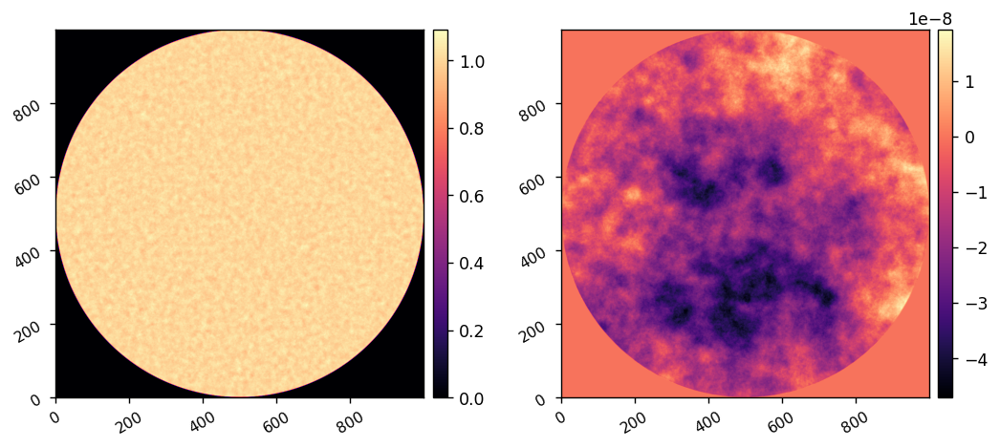

In [2]:
reload(fresnel)
I = fresnel.CORO()
I.use_opds = True

AMP, OPD = I.calc_pupil()
imshow2(AMP, OPD)

/home/kianmilani/Projects/adefc-vortex/adefc_vortex


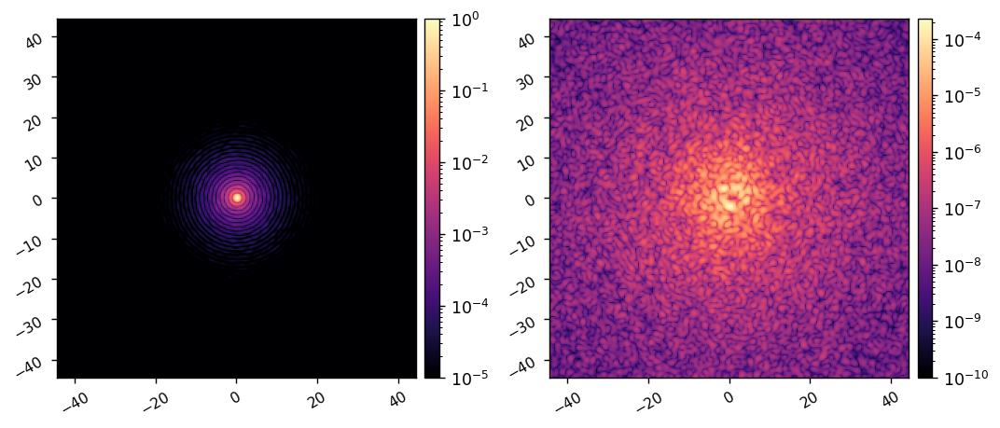

In [3]:
reload(fresnel)
I = fresnel.CORO()
I.use_opds = True

I.use_vortex = False
ref_psf = I.snap()
I.Imax_ref = xp.max(ref_psf)
ref_psf /= I.Imax_ref
I.use_vortex = True
ref_coro_im = I.snap()

imshow2(ref_psf, ref_coro_im,
        pxscl=I.psf_pixelscale_lamDc, lognorm=True, vmin1=1e-5, vmin2=1e-10)


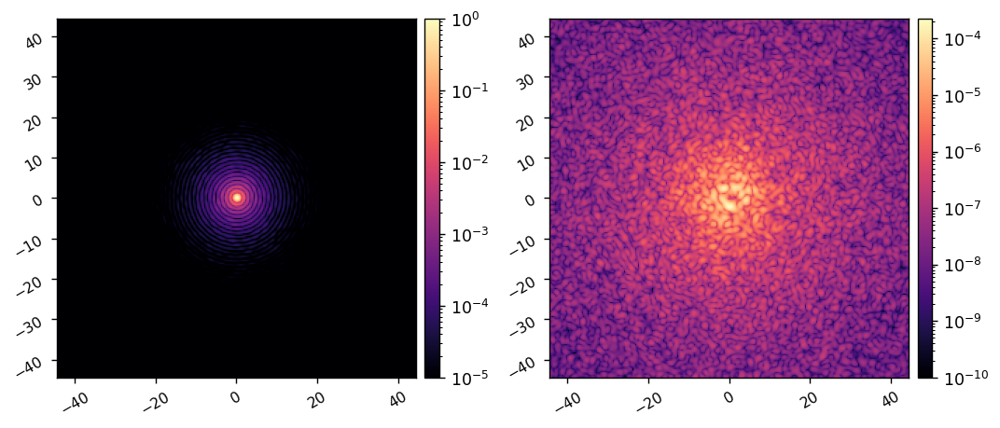

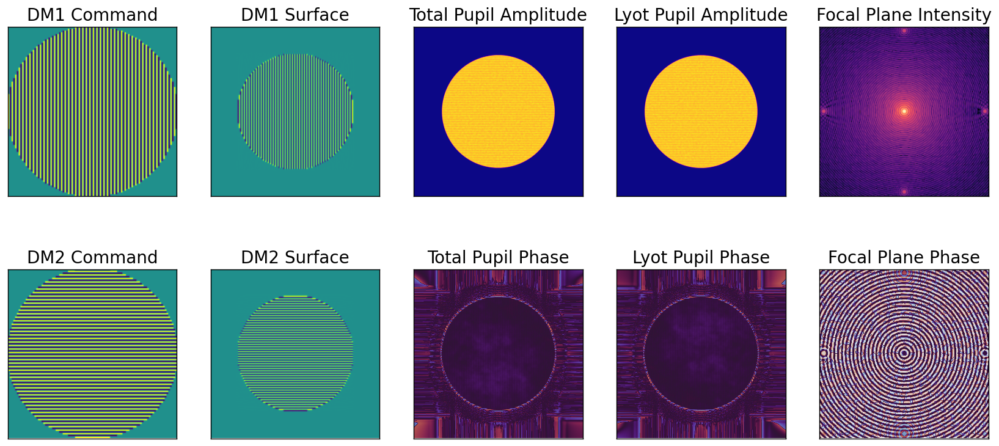

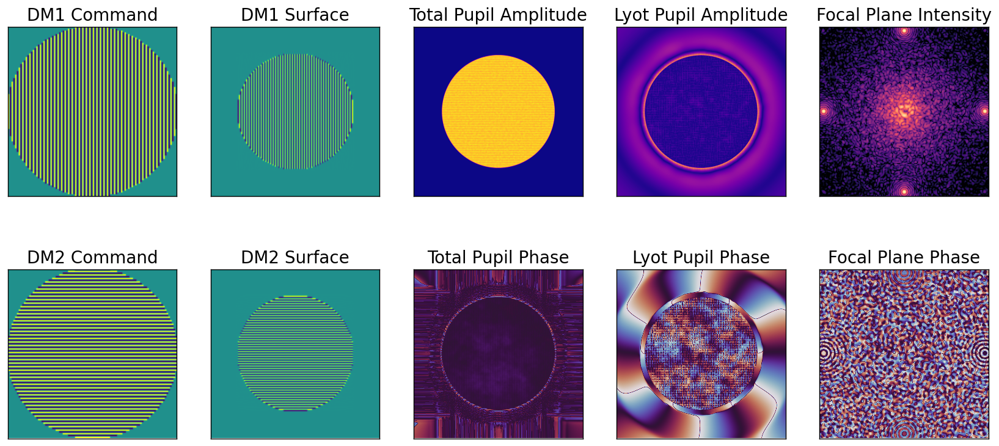

In [4]:
reload(fraunhofer)
M = fraunhofer.MODEL()
M.AMP = AMP
M.OPD = OPD

M.flip_dm = True
M.flip_lyot = True

acts = xp.zeros(M.Nacts)

model_psf = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=0) )**2
M.setattr('Imax_ref', xp.max(model_psf))
model_psf /= M.Imax_ref

model_coro_im = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=1) )**2

imshow2(model_psf, model_coro_im,
        pxscl=M.psf_pixelscale_lamDc, lognorm=True, vmin1=1e-5, vmin2=1e-10)

dm1_command, dm2_command = ( xp.zeros((M.Nact, M.Nact)), xp.zeros((M.Nact, M.Nact)) )
# command = 50e-9*utils.make_f(h=10, w=6, shift=(0,0))
dm1_command = 2.5e-9*utils.make_fourier_command(x_cpa=48, y_cpa=0, Nact=96)
dm2_command = 2.5e-9*utils.make_fourier_command(x_cpa=0, y_cpa=48, Nact=96)

acts = xp.concatenate([dm1_command[M.dm_mask], dm2_command[M.dm_mask]])
fpwf = M.forward(acts, M.wavelength_c, use_vortex=0, fancy_plot=1)
fpwf = M.forward(acts, M.wavelength_c, use_vortex=1, fancy_plot=1)

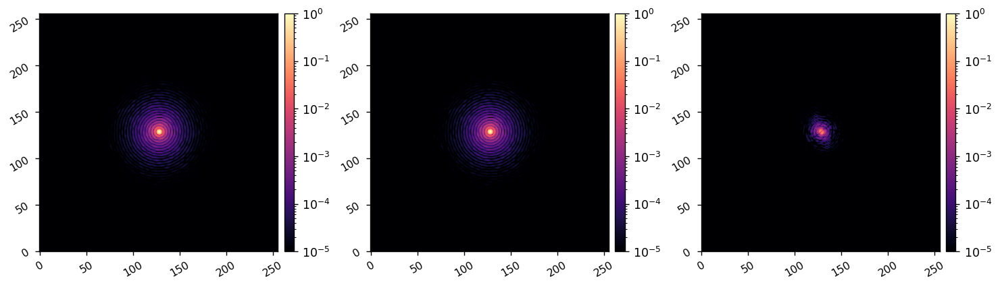

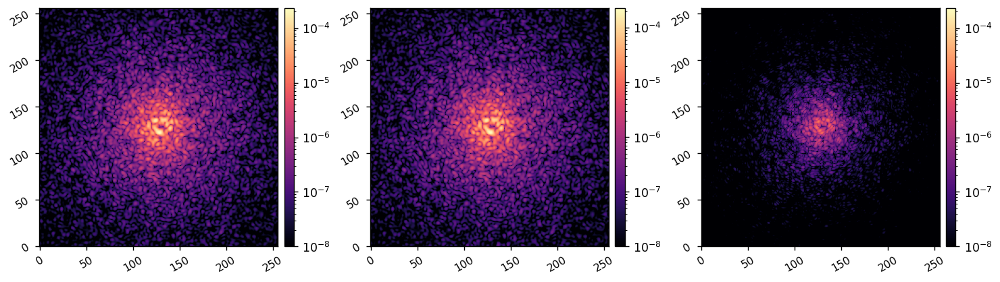

In [8]:
imshow3(ref_psf, model_psf, xp.abs(ref_psf - model_psf), 
        lognorm1=True, lognorm2=True, lognorm3=True, vmax3=1, 
        vmin1=1e-5, vmin2=1e-5, vmin3=1e-5)

imshow3(ref_coro_im, model_coro_im, xp.abs(ref_coro_im - model_coro_im), 
        lognorm1=True, lognorm2=True, lognorm3=True, vmax3=xp.max(ref_coro_im), 
        vmin1=1e-8, vmin2=1e-8, vmin3=1e-8)

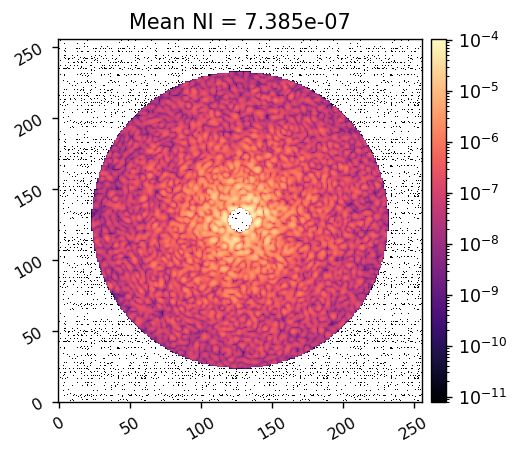

In [5]:
reload(utils)
I.zero_dms()
iwa = 3
owa = 36
rot = 0
control_mask = utils.create_annular_focal_plane_mask(I.npsf, I.psf_pixelscale_lamDc, irad=iwa, orad=owa, edge=None, rotation=rot)
mean_ni = xp.mean(ref_coro_im[control_mask])

imshow1(ref_coro_im*control_mask, f'Mean NI = {mean_ni:.3e}', lognorm=True)


In [38]:
3.4 * 47/48 * 0.9 , 41 * 47/48 * 0.9 

(2.9962499999999994, 36.13125)

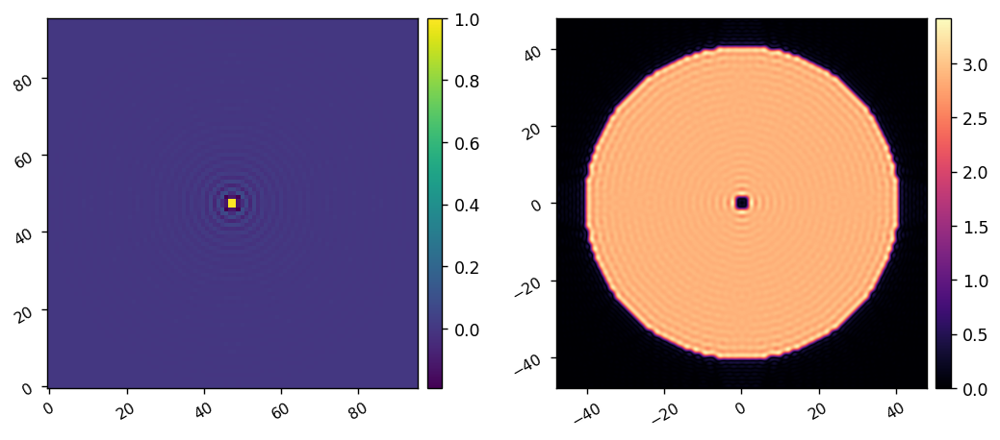

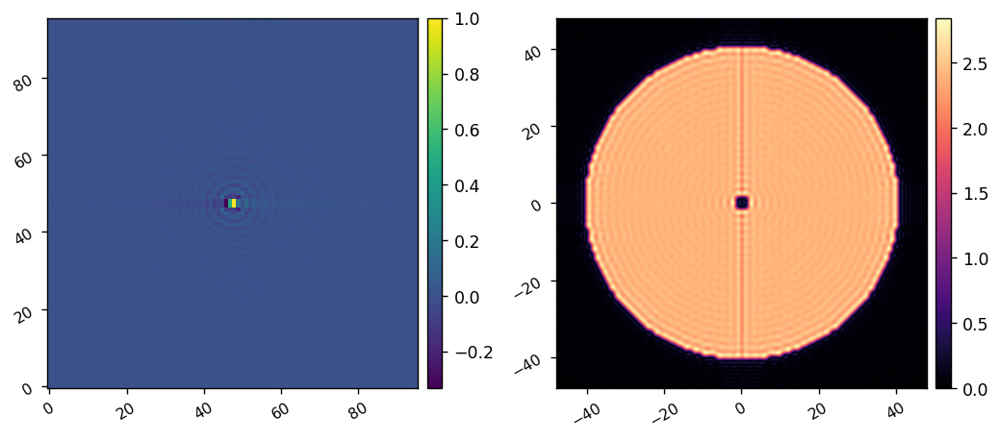

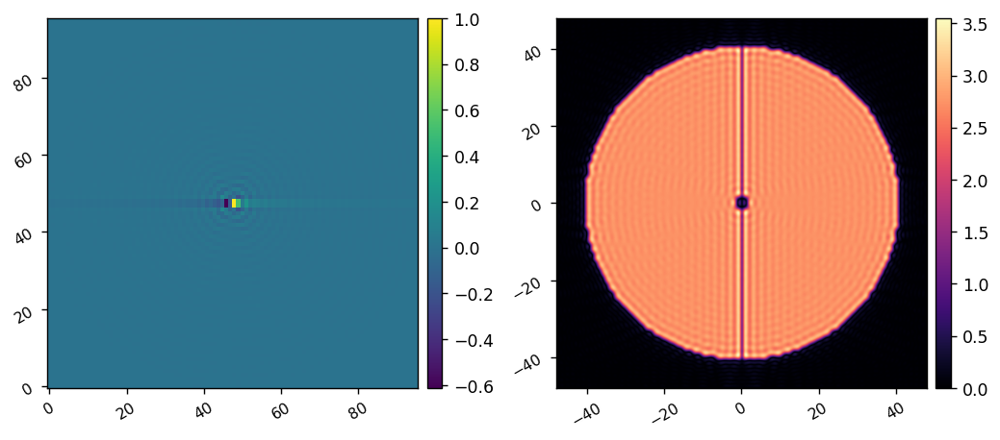

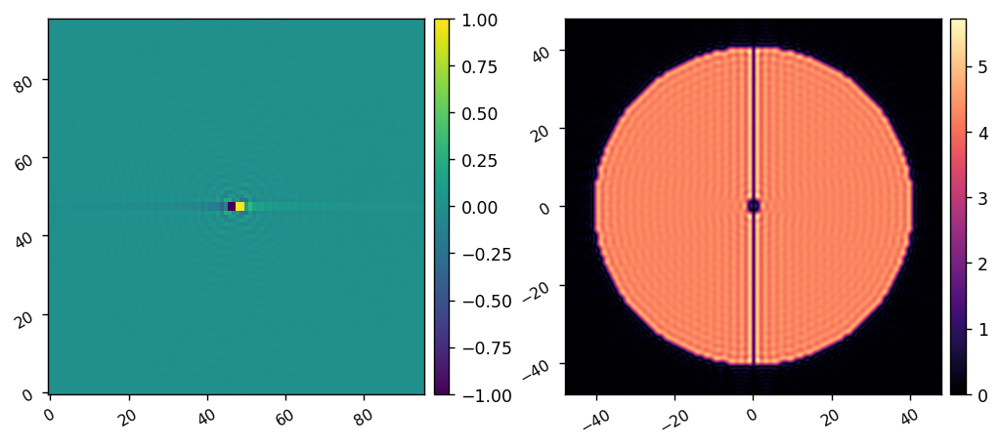

In [18]:
reload(utils)
fourier_probes = utils.create_fourier_probes(
    I.dm_mask, I.npsf, I.psf_pixelscale_lamDc, 
    iwa-0.5, owa+4, 
    # 3.4 * 47/48 * 0.9 , 41 * 47/48 * 0.9, 
    edge=None, 
    fourier_sampling=0.75, 
    nprobes=4,
    plot=True,
    # use_weighting=True,
)
fourier_probes[1] = xp.rot90(xp.rot90(fourier_probes[1]))
fourier_probes[2] = xp.rot90(xp.rot90(fourier_probes[2]))

In [29]:
np.arange(0, 96, 12)

array([ 0, 12, 24, 36, 48, 60, 72, 84])

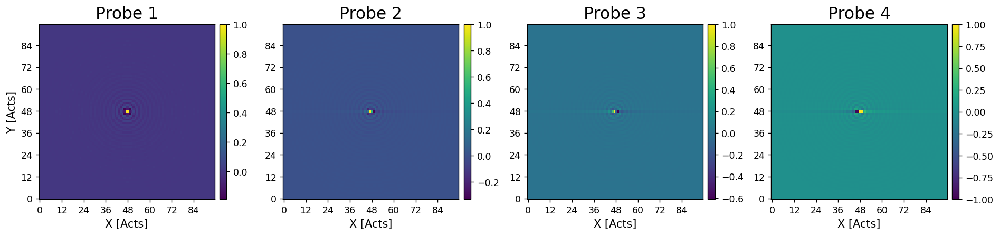

In [34]:
import matplotlib.pyplot as plt
plt.rcParams['image.origin']='lower'
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm, Normalize
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Circle

fig,ax = plt.subplots(nrows=1, ncols=4, figsize=(18,12), dpi=125)
ext = I.psf_pixelscale_lamDc*I.npsf/2
extent = [-ext, ext, -ext, ext]

patch1 = Circle((0,0), 3, fill=False, color='lime', linewidth=2.0)
patch2 = Circle((0,0), 36, fill=False, color='cyan', linewidth=2.0)

w = 0.275
tfs = 18
ticks = np.arange(0, 96, 12)

im1 = ax[0].imshow( ensure_np_array(fourier_probes[0]), cmap='viridis')
ax[0].set_title(f'Probe 1', fontsize=tfs)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im1, cax=cax)
ax[0].set_xticks(ticks)
ax[0].set_yticks(ticks)
ax[0].set_xlabel('X [Acts]', fontsize=12)
ax[0].set_ylabel('Y [Acts]', fontsize=12)

im2 = ax[1].imshow( ensure_np_array(fourier_probes[1]), cmap='viridis')
ax[1].set_title(f'Probe 2', fontsize=tfs)
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im2, cax=cax,)
# cbar.ax.set_ylabel('m', rotation=0, labelpad=7)
ax[1].set_xticks(ticks)
ax[1].set_yticks(ticks)
ax[1].set_xlabel('X [Acts]', fontsize=12)

im3 = ax[2].imshow( ensure_np_array(fourier_probes[2]), cmap='viridis')
ax[2].set_title(f'Probe 3', fontsize=tfs)
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im3, cax=cax)
# cbar.ax.set_ylabel('NI', rotation=0, labelpad=7)
# ax[2].set_position([0.49, 0, w, w])
ax[2].set_xticks(ticks)
ax[2].set_yticks(ticks)
ax[2].set_xlabel('X [Acts]', fontsize=12)

im4 = ax[3].imshow( ensure_np_array(fourier_probes[3]), cmap='viridis')
ax[3].set_title(f'Probe 4', fontsize=tfs)
divider = make_axes_locatable(ax[3])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im4, cax=cax,)
# cbar.ax.set_ylabel('NI', rotation=0, labelpad=7)
ax[3].set_xticks(ticks)
ax[3].set_yticks(ticks)
ax[3].set_xlabel('X [Acts]', fontsize=12)

plt.subplots_adjust(wspace=0.3)
fig.savefig('../figs/sim_probes.pdf', format='pdf', bbox_inches="tight")

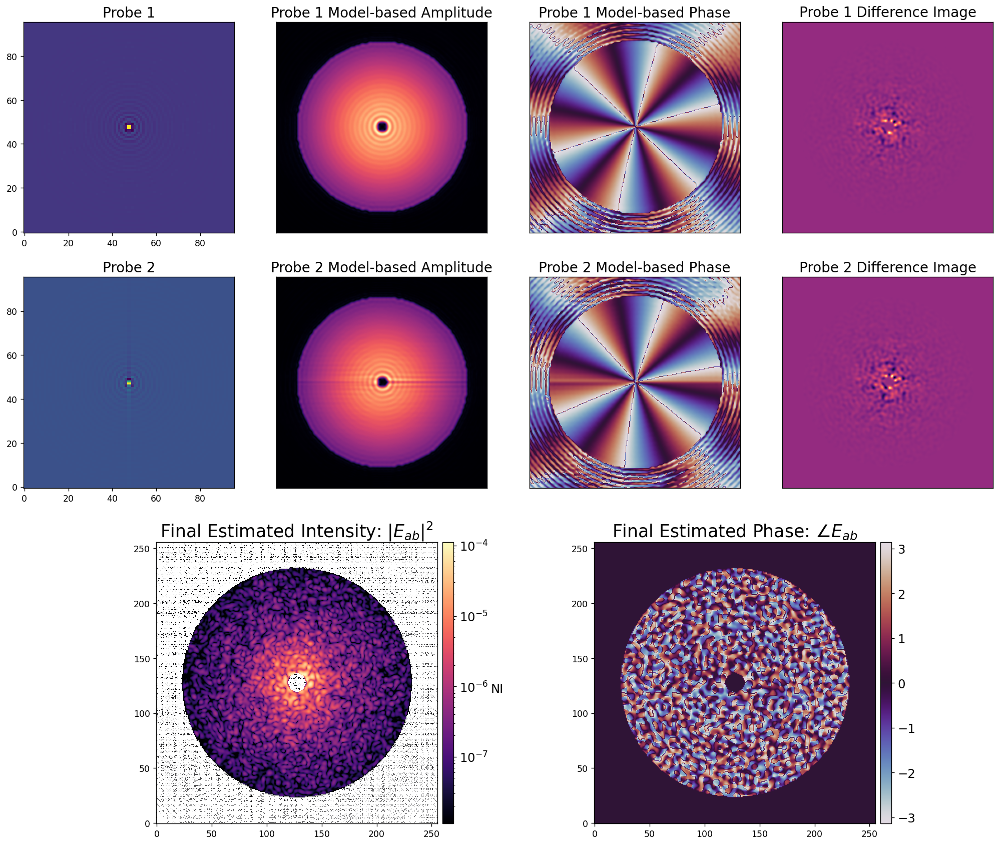

In [9]:
reload(pwp)

current_acts = xp.zeros(M.Nacts)

I.set_dm1(fraunhofer.acts_to_command(current_acts[:M.Nacts//2], M.dm_mask))
I.set_dm2(fraunhofer.acts_to_command(current_acts[M.Nacts//2:], M.dm_mask))

E_pwp, E_probes, diff_ims = pwp.run(
    I, M, 
    control_mask, 
    fourier_probes, 
    2.5e-9,
    M.wavelength_c, 
    plot=True,
    # plot_est=True,
    Ndms=2,
    return_all=True,
)

In [33]:
40 * 47/48 * 0.9 

35.25

In [31]:
96/2 * 47/48 * 0.9 

42.300000000000004

In [10]:
I.zero_dms()
data = {
    # 'ref_im':ref_coro_im, 
    'images':[ref_coro_im],
    'efields':[],
    'dm1_commands':[],
    'del_dm1_commands':[],
    'dm2_commands':[],
    'del_dm2_commands':[],
    'reg_conds':[],
    'bfgs_tols':[],
    'pixelscale':I.psf_pixelscale_lamDc,
    'control_mask':control_mask, 
}

Running PWP ...


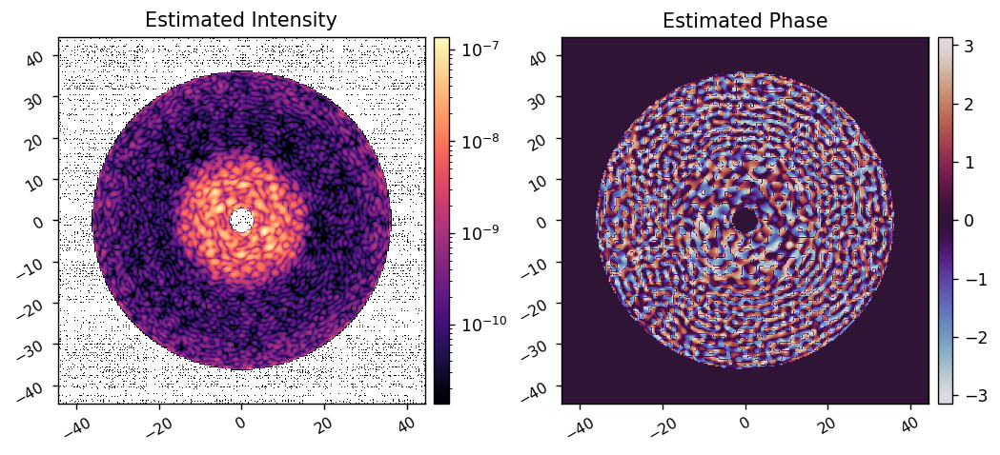

Computing EFC command with L-BFGS


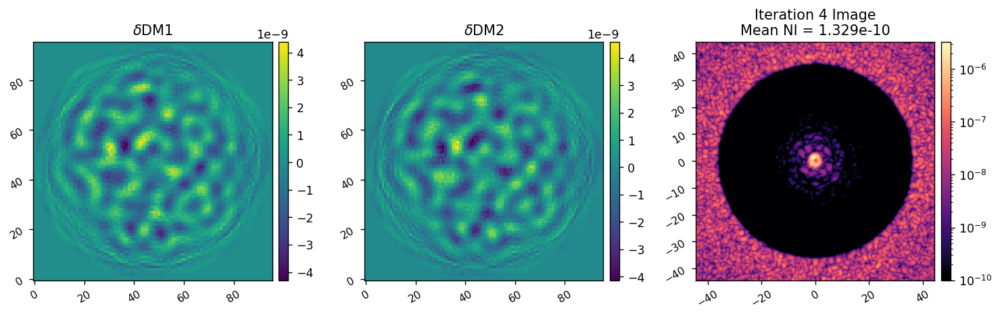

Running PWP ...


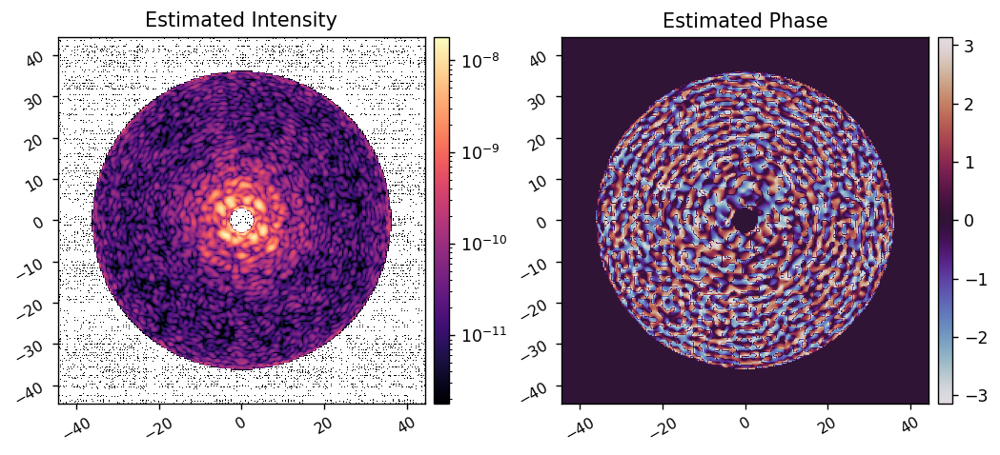

Computing EFC command with L-BFGS


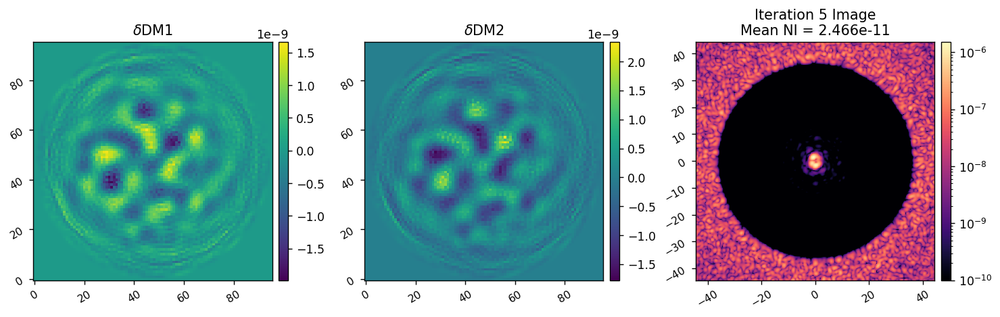

Running PWP ...


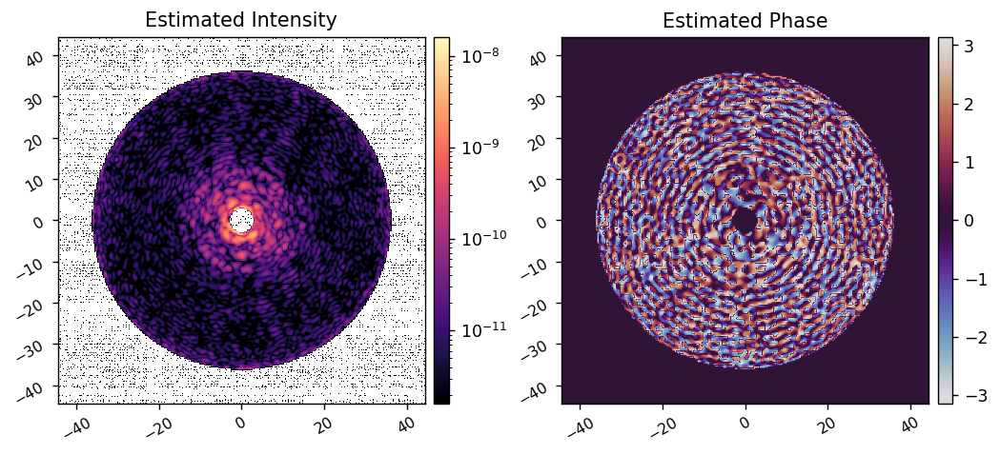

Computing EFC command with L-BFGS


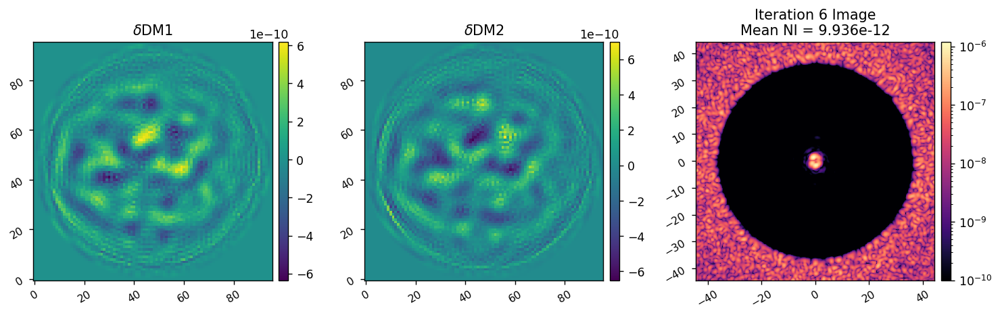

In [12]:
reload(fraunhofer)
reload(aefc)

r_cond = 1e-2
# r_cond = 1e-3
# r_cond = 1e-4
r_cond = 1e-5
# r_cond = 1e-6

bfgs_tol = 1e-2
bfgs_tol = 1e-3
# bfgs_tol = 1e-4
# bfgs_tol = 1e-5

bfgs_opts = {
    'disp':0,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

pwp_params = {
    'control_mask':control_mask, 
    'probes':fourier_probes,
    'probe_amp':2.5e-9,
    'probe_amp':1.5e-9,
    'probe_amp':0.5e-9,
    'wavelength':M.wavelength_c, 
    'reg_cond':1e-2,
    'Ndms':2,
    # 'plot':True,
    'plot_est':True, 
}


data = aefc.run(
    I, 
    M, 
    fraunhofer.val_and_grad, 
    control_mask, 
    data,
    pwp_params, 
    Nitr=3, 
    reg_cond=r_cond,
    bfgs_tol=bfgs_tol,
    bfgs_opts=bfgs_opts,
    gain=1,
)

In [21]:
from datetime import datetime
today = int(datetime.today().strftime('%Y%m%d'))
utils.save_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{today}_aefc_mono_pwp.pkl', data)

Saved data to:  /npool/nvme/kianmilani/aefc-vortex-data/20241203_aefc_mono_pwp.pkl


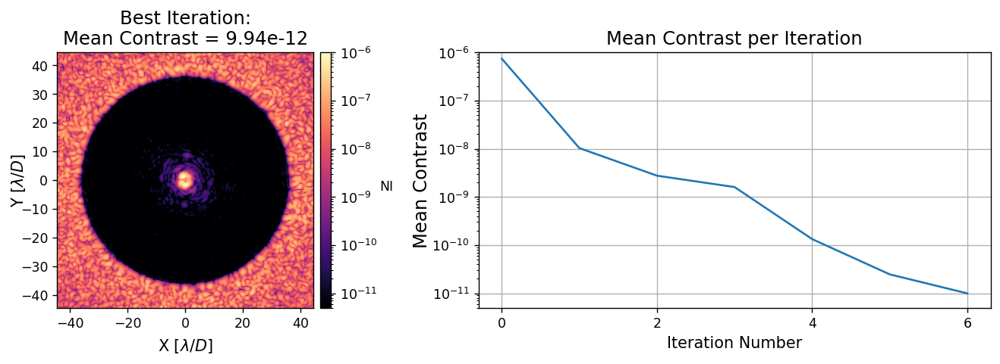

In [13]:
import adefc_vortex.imshows as imshows
reload(imshows)
imshows.plot_data(
    data, 
    vmin=5e-12, vmax=1e-6,
    imvmin=5e-12, imvmax=1e-6,
)

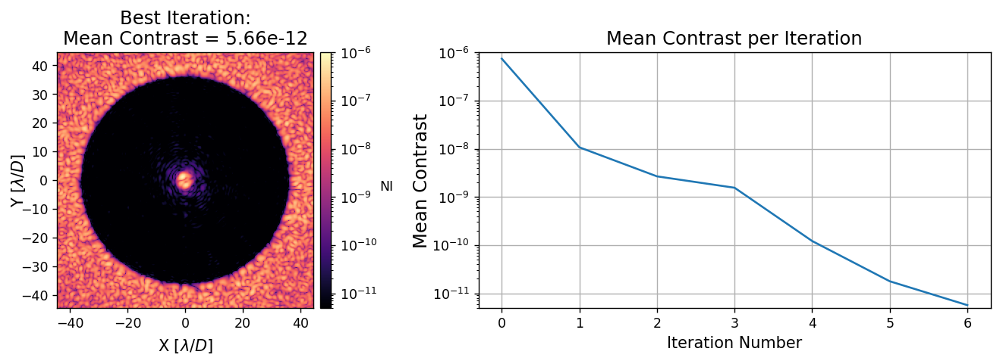

In [17]:
data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241203}_aefc_mono_pwp.pkl')

import adefc_vortex.imshows as imshows
reload(imshows)
imshows.plot_data(
    data, 
    vmin=5e-12, vmax=1e-6,
    imvmin=5e-12, imvmax=1e-6,
    xticks=np.linspace(0,6,7),
    fname='../figs/sim_mono_pwp.pdf',
)